`matplotlib` magic command (only necessary for `jupyter` notebooks).

In [1]:
%matplotlib inline

Install `cityseer` if necessary.

In [2]:
!pip install cityseer

# Graph cleaning

Good sources of street network data, such as the Ordnance
Survey's [OS Open Roads](https://www.ordnancesurvey.co.uk/business-and-government/products/os-open-roads.html), typically have two distinguishing characteristics:

- The network has been simplified to its essential structure: i.e. unnecessarily complex representations of intersections; on-ramps; split roadways; etc. have been reduced to a simpler representation concurring more readily with the core topological structure of street networks. This is in contrast to network representations focusing on completeness (e.g. for route way-finding, see [OS ITN Layer](https://www.ordnancesurvey.co.uk/business-and-government/help-and-support/products/itn-layer.html)): these introduce unnecessary complexity serving to hinder rather than help shortest-path algorithms in the sense used by pedestrian centrality measures.
- The topology of the network is kept distinct from the geometry of the streets. Oftentimes, as can be seen with [Open Street Map](https://www.openstreetmap.org), additional nodes are added to streets for the purpose of representing geometric twists and turns along a roadway. These additional nodes cause topological distortions that impact network centrality measures.

When a high-quality source is available, it may be best not to attempt additional cleanup unless there is a particular reason to do so. On the other-hand, many indispensable sources of network information, particularly Open Street Map data, can be messy for the purposes of network analysis. This section describes how such sources can be cleaned and prepared for subsequent analysis.

## Downloading data

This example will make use of OSM data downloaded from the [OSM API](https://wiki.openstreetmap.org/wiki/API). To keep things interesting, let's pick London Soho, which will be buffered and cleaned for a 1,250m radius.

In [2]:
from shapely import geometry
import utm

from cityseer.tools import graphs, plot, mock

<Figure size 432x288 with 0 Axes>

Let's download data within a 1,250m buffer around London Soho:

INFO:cityseer.tools.graphs:Converting networkX graph from WGS to UTM.
INFO:cityseer.tools.graphs:Processing node x, y coordinates.


  0%|          | 0/10344 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Processing edge geom coordinates, if present.


  0%|          | 0/11809 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

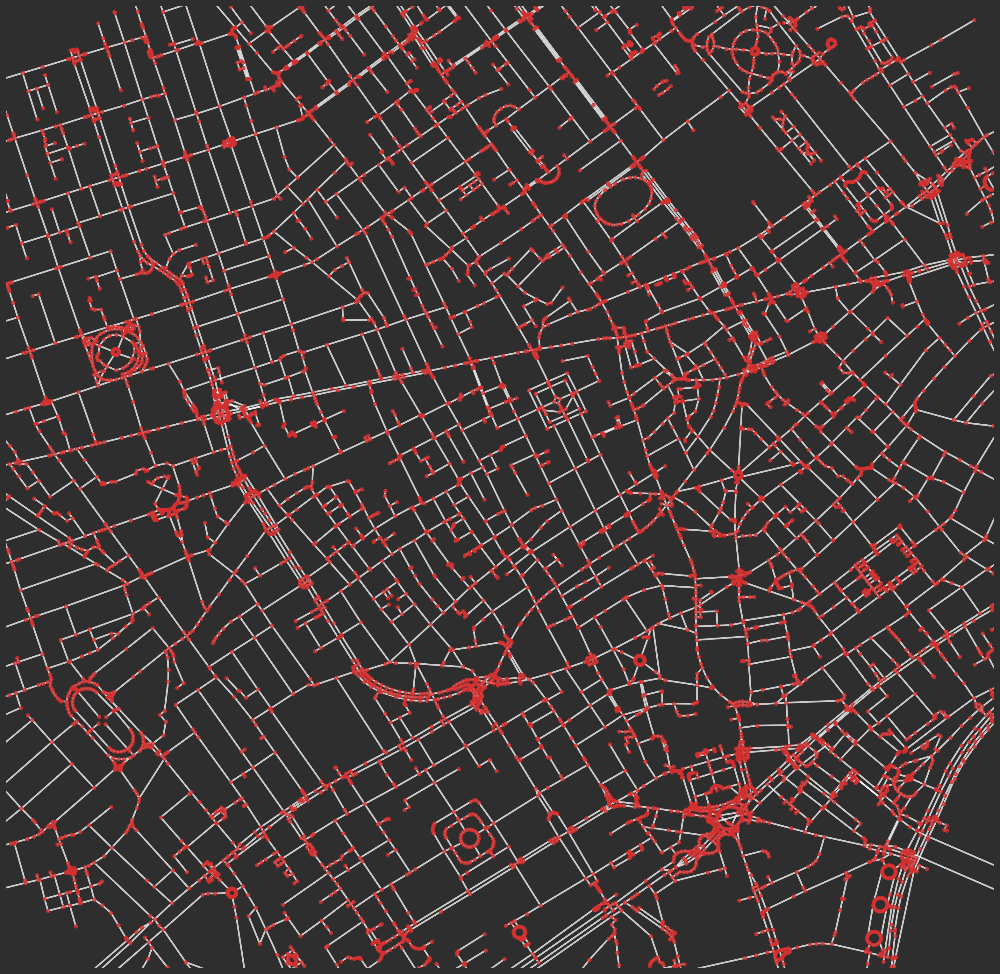

In [3]:
from shapely import geometry
import utm

from cityseer.tools import graphs, plot, mock

# Let's download data within a 1,250m buffer around London Soho:
lng, lat = -0.13396079424572427, 51.51371088849723
G_utm = mock.make_buffered_osm_graph(lng, lat, 1250)

# As an alternative, you can use OSMnx to download data. Set simplify to False:
# e.g.: OSMnx_multi_di_graph = ox.graph_from_point((lat, lng), dist=1250, simplify=False)
# Then convert to a cityseer compatible MultiGraph:
# e.g.: G_utm = graphs.nX_from_OSMnx(OSMnx_multi_di_graph, tolerance=10)

# select extents for plotting
easting, northing = utm.from_latlon(lat, lng)[:2]
# buffer
buff = geometry.Point(easting, northing).buffer(1000)
# extract extents
min_x, min_y, max_x, max_y = buff.bounds


# reusable plot function
def simple_plot(_G, plot_geoms=True):
    # plot using the selected extents
    plot.plot_nX(_G,
                 labels=False,
                 plot_geoms=plot_geoms,
                 node_size=15,
                 edge_width=2,
                 x_lim=(min_x, max_x),
                 y_lim=(min_y, max_y),
                 figsize=(20, 20),
                 dpi=200)


simple_plot(G_utm, plot_geoms=False)

## Deducing the network topology

Once OSM data has been converted to a `NetworkX` `MultiGraph`, the `tools.graphs` module can be used to clean the
network.

> The convenience method used for this demonstration has already converted the graph from a geographic WGS to projected UTM coordinate system; however, if working with a graph which is otherwise in a WGS coordinate system then it must be converted to a projected coordinate system prior to further processing. This can be done with [`graphs.nX_wgs_to_utm`](https://cityseer.benchmarkurbanism.com/tools/graphs/#nx_wgs_to_utm).

Now that raw OSM data has been loaded into a NetworkX graph, the `cityseer.tools.graph` methods can be used to further
clean and prepare the network prior to analysis.

At this stage, the raw OSM graph is going to look a bit messy. Note how that nodes have been used to represent the
roadway geometry. These nodes need to be removed and will be abstracted into `shapely` `LineString` geometries assigned
to the respective street edges. So doing, the geometric representation will be kept distinct from the network topology.

INFO:cityseer.tools.graphs:Generating simple (straight) edge geometries.


  0%|          | 0/11809 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Removing filler nodes.


  0%|          | 0/10344 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Removing dangling nodes.


  0%|          | 0/3565 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Removing filler nodes.


  0%|          | 0/3169 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

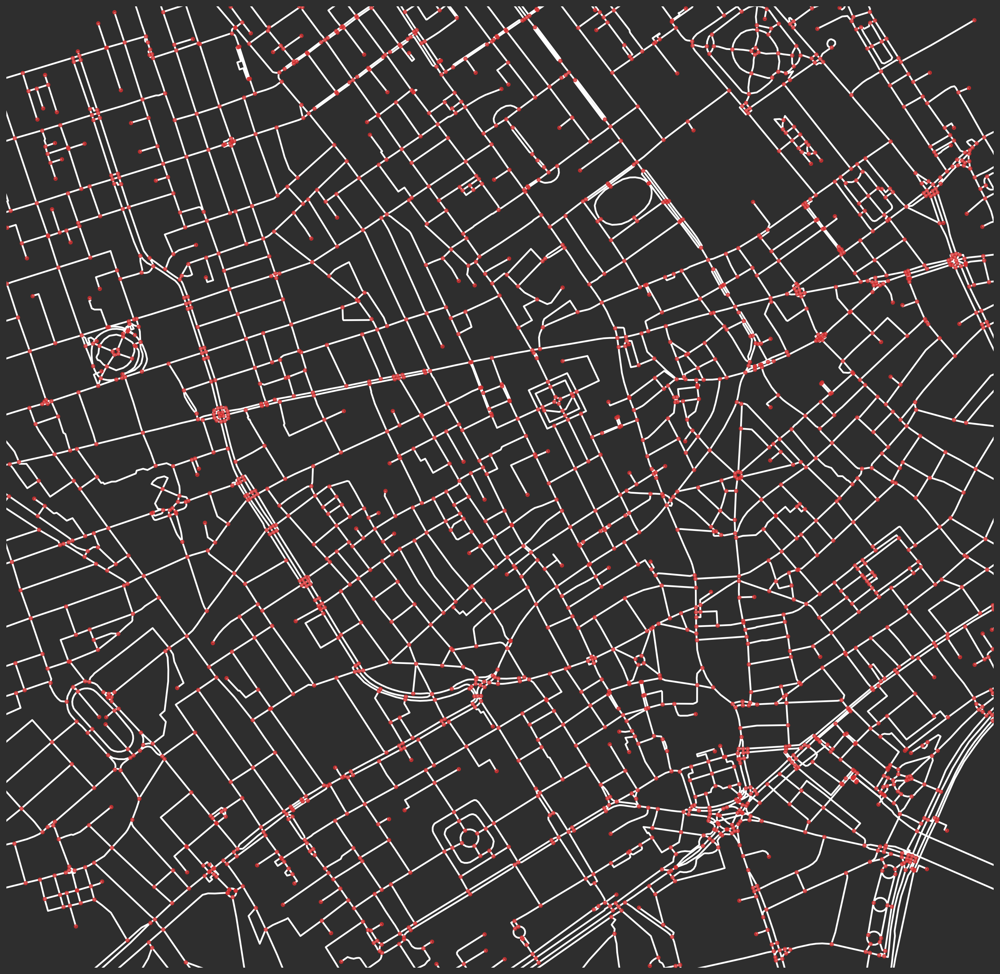

In [4]:
# the raw osm nodes denote the road geometries by the placement of nodes
# the first step generates explicit LineStrings geometries for each street edge
G = graphs.nX_simple_geoms(G_utm)
# We'll now strip the "filler-nodes" from the graph
# the associated geometries will be welded into continuous LineStrings
# the new LineStrings will be assigned to the newly consolidated topological links
G = graphs.nX_remove_filler_nodes(G)
# and remove dangling nodes: short dead-end stubs
# these are often found at entrances to buildings or parking lots
# The removed_disconnected flag will removed isolated network components
# i.e. disconnected portions of network that are not joined to the main street network
G = graphs.nX_remove_dangling_nodes(G, despine=20, remove_disconnected=True)
# removing danglers can cause newly orphaned filler nodes, which we'll remove for good measure
G = graphs.nX_remove_filler_nodes(G)
simple_plot(G)

## Refining the network

Things are already looked much better, but we still have areas with large concentrations of nodes at complex intersections and many parallel roadways, which will confound centrality methods. We'll now try to remove as much of this as possible. These steps involve the consolidation of nodes to clean-up extraneous nodes, which may otherwise exaggerate the intensity or complexity of the network in certain situations.

In this case, we're trying to get rid of parallel road segments so we'll do this in three steps, though it should be noted that, depending on your use-case, Step 1 may already be sufficient:

Step 1: An initial pass to cleanup complex intersections will be performed with
the [`graphs.nX_consolidate_nodes`](https://cityseer.benchmarkurbanism.com/tools/graphs/#nx_consolidate_nodes) function. The arguments passed to the parameters allow for a number of different strategies, such as whether to 'crawl'; minimum and maximum numbers of nodes to consider for consolidation; and to set the policies according to which nodes and edges are consolidated. These are explained more fully in the documentation. In this case, we're accepting the defaults except for explicitly setting the buffer distance and bumping the minimum size of node groups to be considered for consolidation from 2 to 3.

INFO:cityseer.tools.graphs:Consolidating nodes.


  0%|          | 0/2915 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Removing filler nodes.


  0%|          | 0/2336 [00:00<?, ?it/s]

  0%|          | 0/3667 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

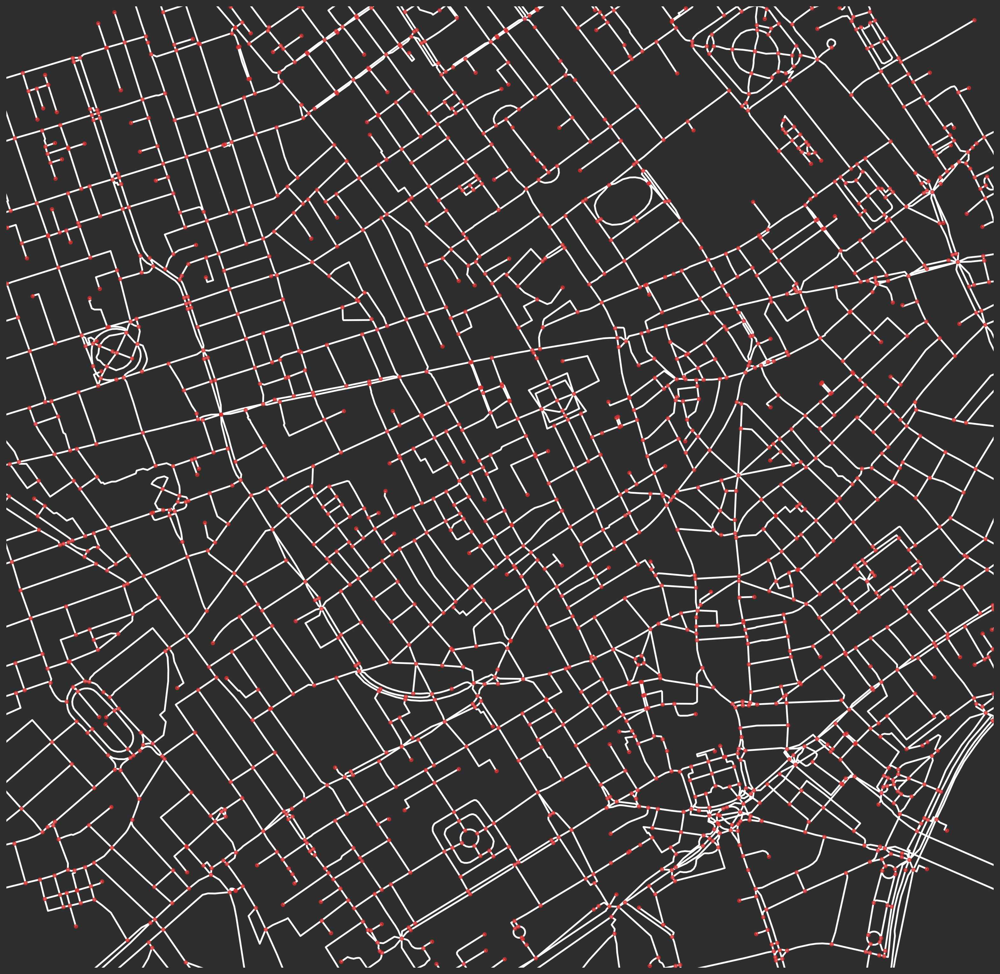

In [5]:
G1 = graphs.nX_consolidate_nodes(G, buffer_dist=10, min_node_group=3)
simple_plot(G1)

Complex intersections have now been simplified, for example, the intersection of Oxford and Regent has gone from 17
nodes to a single node.

In Step 2, we'll use [`graphs.nX_split_opposing_geoms`](https://cityseer.benchmarkurbanism.com/tools/graphs/#nx_split_opposing_geoms) to intentionally split
edges in near proximity to nodes located on an adjacent roadway. This is going to help with the final pass of
consolidation in Step 3.

INFO:cityseer.tools.graphs:Splitting opposing edges.


  0%|          | 0/2324 [00:00<?, ?it/s]

  0%|          | 0/3723 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

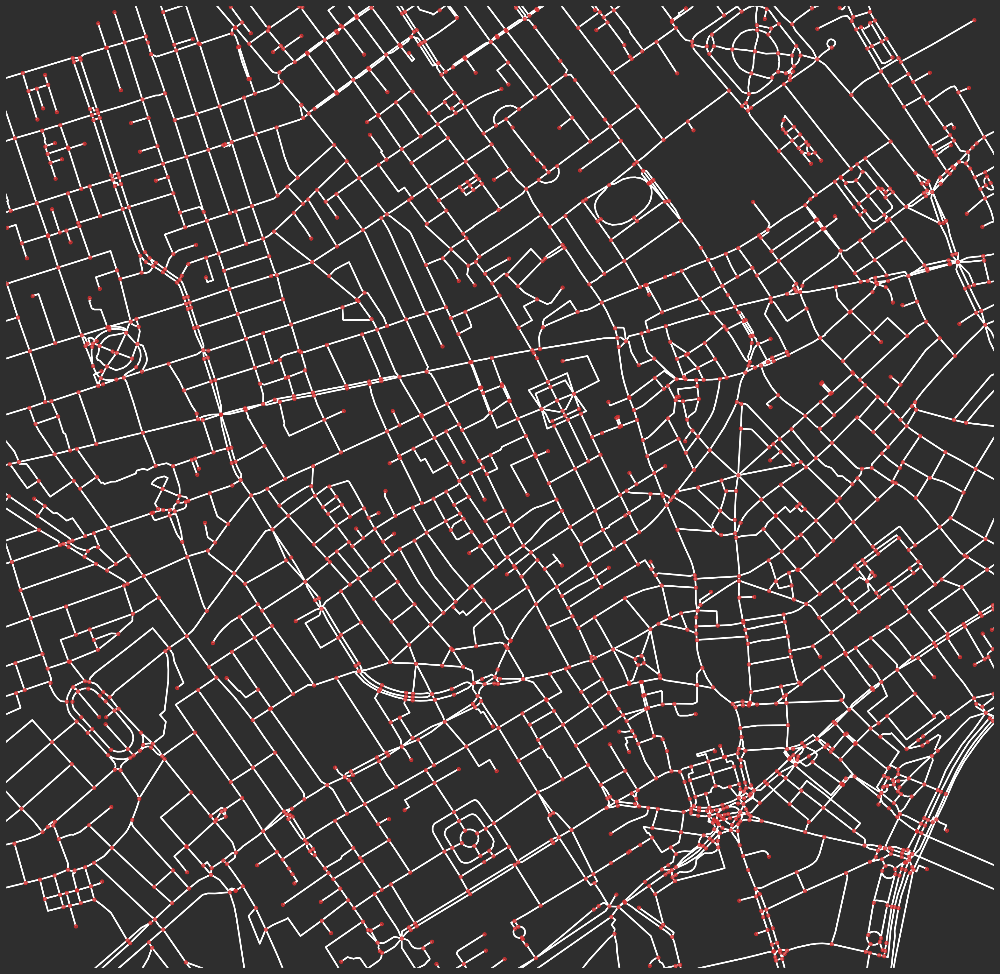

In [6]:
G2 = graphs.nX_split_opposing_geoms(G1, buffer_dist=15)
simple_plot(G2)

In the final step, we can now rerun the consolidation to clean up any remaining clusters of nodes. In this case, we're setting the `crawl` parameter to `False`, setting `min_node_degree` down to 2, and prioritising nodes of `degree=4` for determination of the newly consolidated centroids:

INFO:cityseer.tools.graphs:Consolidating nodes.


  0%|          | 0/2558 [00:00<?, ?it/s]

INFO:cityseer.tools.graphs:Removing filler nodes.


  0%|          | 0/1847 [00:00<?, ?it/s]

  0%|          | 0/2996 [00:00<?, ?it/s]

<Figure size 432x288 with 0 Axes>

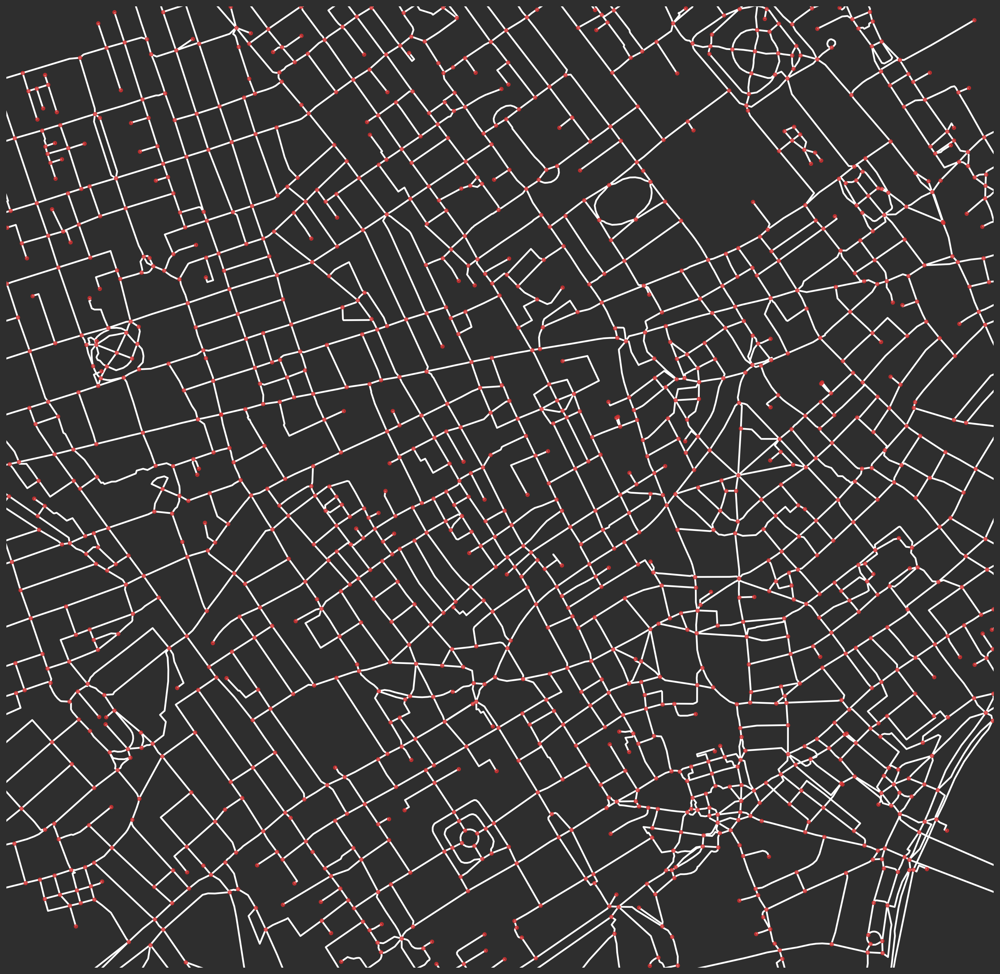

In [7]:
G3 = graphs.nX_consolidate_nodes(G2,
                                 buffer_dist=15,
                                 crawl=False,
                                 min_node_degree=2,
                                 cent_min_degree=4)
simple_plot(G3)

The above recipe should be enough to get you started, but there are innumerable other strategies that may also work for any variety of scenarios.